### Key takeaways from the paper

The system uses neural representations to separate and recombine content and style of arbitrary images, providing a neural algorithm for the creation of artistic images.

The key finding of this paper is that the representations of content and style in the Convolutional
Neural Network are separable. That is, we can manipulate both representations independently
to produce new, perceptually meaningful images.

#### What is a content of Image ? 

When Convolutional Neural Networks are trained on object recognition, they develop a
representation of the image that makes object information increasingly explicit along the processing
hierarchy.8 Therefore, along the processing hierarchy of the network, the input image
is transformed into representations that increasingly care about the actual content of the image
compared to its detailed pixel values. We can directly visualise the information each layer
contains about the input image by reconstructing the image only from the feature maps in that
layer9 (Fig 1, content reconstructions, see Methods for details on how to reconstruct the image).
Higher layers in the network capture the high-level content in terms of objects and their
arrangement in the input image but do not constrain the exact pixel values of the reconstruction.
(Fig 1, content reconstructions d,e). In contrast, reconstructions from the lower layers
simply reproduce the exact pixel values of the original image (Fig 1, content reconstructions
a,b,c). We therefore refer to the feature responses in higher layers of the network as the content
representation.

#### What is a style of an Image ? 

### Implementation

#### Import Dependencies

In [1]:
%matplotlib inline

In [2]:
from keras.models import Model, Sequential 
import numpy as np 
from PIL import Image 
from keras import backend as K 
import keras 
import scipy
import matplotlib.pyplot as plt

Using TensorFlow backend.


In [3]:
from vgg16_avg import VGG16_Avg

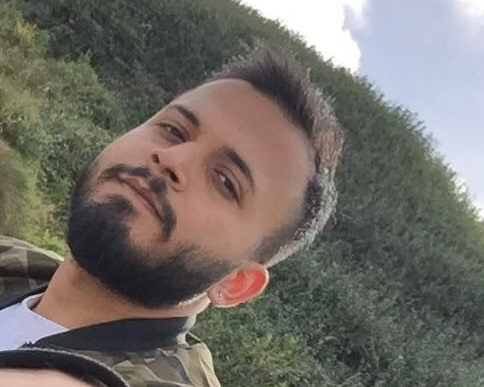

In [52]:
content_image_raw = Image.open('C:\\Users\\vs76289\\Desktop\\fastai\\c2\\styleTransfer\\img\\cont.jpg');
content_image_raw

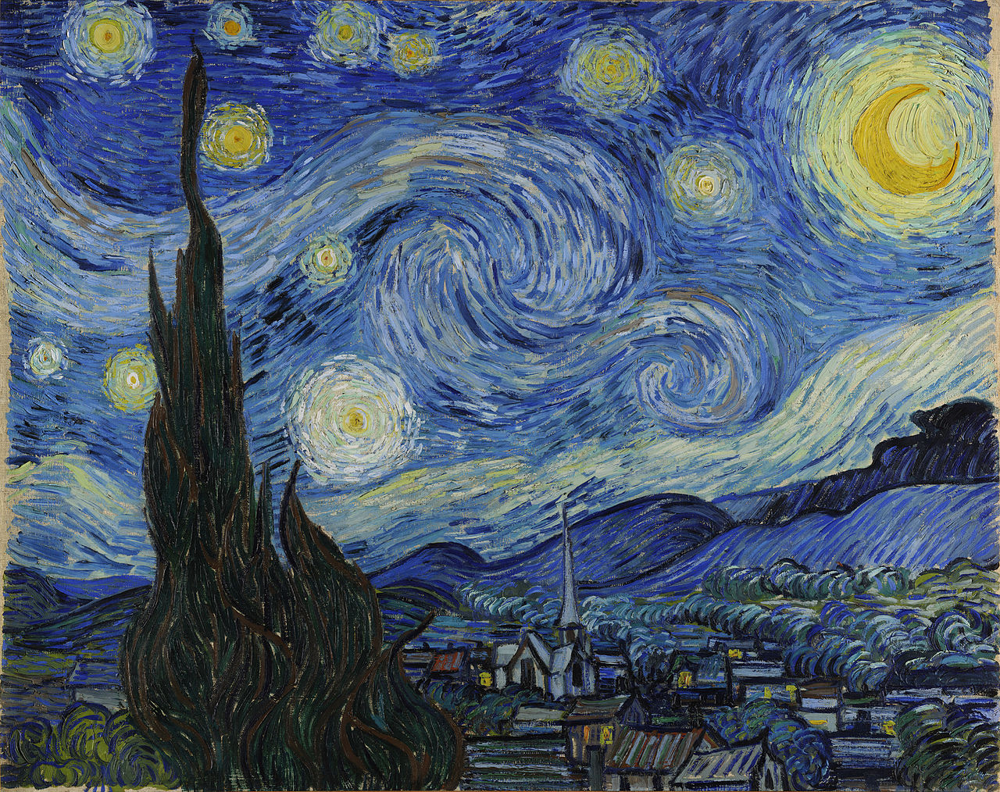

In [53]:
style_image_raw = Image.open('C:\\Users\\vs76289\\Desktop\\fastai\\c2\\styleTransfer\\img\\starry_night_google.jpg');
style_image_raw

#### Preprocessing Functions 

In [6]:
vgg_mean = np.array([123.68, 116.779, 103.939], dtype=np.float32)

In [7]:
preproc = lambda x: (x-vgg_mean)[:,:,:,::-1]

In [8]:
depreproc = lambda x,s: np.clip(x.reshape(s)[:,:,:,::-1] + vgg_mean ,0,255) 

In [54]:
content = preproc(np.expand_dims(np.array(content_image_raw),0))
content_shape = content.shape

In [55]:
style = preproc(np.expand_dims(np.array(style_image_raw),0))
style_shape = style.shape

#### Content  

In [11]:
model = VGG16_Avg(include_top = False)

In [12]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (AveragePooling2 (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (AveragePooling2 (None, None, None, 128)   0         
__________

In [13]:
layer = model.get_layer('block5_conv1').output

In [14]:
content_model = Model(model.input, layer)

In [15]:
content_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (AveragePooling2 (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (AveragePooling2 (None, None, None, 128)   0         
__________

In [16]:
targ = K.variable(content_model.predict(content))

In [17]:
targ.shape

TensorShape([Dimension(1), Dimension(24), Dimension(30), Dimension(512)])

In [18]:
loss = K.mean(keras.metrics.mse(layer,targ))
grads = K.gradients(loss,content_model.input)

In [19]:
class Evaluator(object):
    
    def __init__(self,f,shp): self.f, self.shp = f, shp
    
    def loss(self,x):
        loss_, self.grad_values = self.f([x.reshape(self.shp)])
        return loss_.astype(np.float64)

    def grads(self, x): return self.grad_values.flatten().astype(np.float64)

In [20]:
fn = K.function([content_model.input], [loss]+grads)
evaluator = Evaluator(fn,content_shape)

In [21]:
def solve_content_image(eval_obj,niter, x):
    for i in range(niter):
        x, min_val, info = scipy.optimize.fmin_l_bfgs_b(eval_obj.loss, x.flatten(), 
                                                   fprime= eval_obj.grads, maxfun = 20)
        x = np.clip(x,-127,127)
        print('Current Loss is {}'.format(min_val))
        scipy.misc.imsave('Content_at_iter_{}.jpg'.format(i), depreproc(x.copy(),content_shape)[0])
    return x

In [22]:
iterations = 10

In [24]:
content_shape

(1, 387, 484, 3)

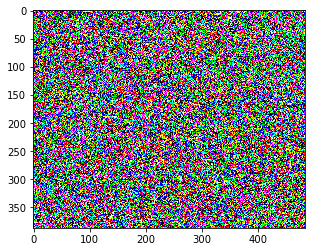

In [23]:
rand_img = lambda shape: np.random.uniform(-2.5,2.5,shape)/100
x = rand_img(content_shape)
plt.imshow(x[0])

In [25]:
x.shape

(1, 387, 484, 3)

In [26]:
x = solve_content_image(evaluator, iterations, x)

Current Loss is 39.231773376464844
Current Loss is 15.903844833374023
Current Loss is 9.163713455200195
Current Loss is 6.334935188293457
Current Loss is 4.9545488357543945
Current Loss is 4.089896202087402
Current Loss is 3.5113298892974854
Current Loss is 3.0320892333984375
Current Loss is 2.7209672927856445
Current Loss is 2.6546788215637207


In [ ]:
Image.open('Content_at_iter_9.jpg')

#### Style 

In [27]:
model = VGG16_Avg(include_top = False, input_shape = style_shape[1:])

In [28]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 1014, 1280, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 1014, 1280, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 1014, 1280, 64)    36928     
_________________________________________________________________
block1_pool (AveragePooling2 (None, 507, 640, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 507, 640, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 507, 640, 128)     147584    
_________________________________________________________________
block2_pool (AveragePooling2 (None, 253, 320, 128)     0         
__________

In [29]:
layers = {l.name:l.output for l in model.layers}

In [30]:
layers

{'block1_conv1': <tf.Tensor 'block1_conv1_1/Relu:0' shape=(?, 1014, 1280, 64) dtype=float32>,
 'block1_conv2': <tf.Tensor 'block1_conv2_1/Relu:0' shape=(?, 1014, 1280, 64) dtype=float32>,
 'block1_pool': <tf.Tensor 'block1_pool_1/AvgPool:0' shape=(?, 507, 640, 64) dtype=float32>,
 'block2_conv1': <tf.Tensor 'block2_conv1_1/Relu:0' shape=(?, 507, 640, 128) dtype=float32>,
 'block2_conv2': <tf.Tensor 'block2_conv2_1/Relu:0' shape=(?, 507, 640, 128) dtype=float32>,
 'block2_pool': <tf.Tensor 'block2_pool_1/AvgPool:0' shape=(?, 253, 320, 128) dtype=float32>,
 'block3_conv1': <tf.Tensor 'block3_conv1_1/Relu:0' shape=(?, 253, 320, 256) dtype=float32>,
 'block3_conv2': <tf.Tensor 'block3_conv2_1/Relu:0' shape=(?, 253, 320, 256) dtype=float32>,
 'block3_conv3': <tf.Tensor 'block3_conv3_1/Relu:0' shape=(?, 253, 320, 256) dtype=float32>,
 'block3_pool': <tf.Tensor 'block3_pool_1/AvgPool:0' shape=(?, 126, 160, 256) dtype=float32>,
 'block4_conv1': <tf.Tensor 'block4_conv1_1/Relu:0' shape=(?, 126,

In [31]:
layers_wanted = ['block1_conv1','block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

In [32]:
outputs = [layers[l] for l in layers_wanted]

In [33]:
outputs

[<tf.Tensor 'block1_conv1_1/Relu:0' shape=(?, 1014, 1280, 64) dtype=float32>,
 <tf.Tensor 'block2_conv1_1/Relu:0' shape=(?, 507, 640, 128) dtype=float32>,
 <tf.Tensor 'block3_conv1_1/Relu:0' shape=(?, 253, 320, 256) dtype=float32>,
 <tf.Tensor 'block4_conv1_1/Relu:0' shape=(?, 126, 160, 512) dtype=float32>,
 <tf.Tensor 'block5_conv1_1/Relu:0' shape=(?, 63, 80, 512) dtype=float32>]

In [34]:
style_model = Model(model.input, outputs)

In [35]:
style_targs = [K.variable(o) for o in style_model.predict(style)]

In [36]:
style_targs

[<tf.Variable 'Variable_1:0' shape=(1, 1014, 1280, 64) dtype=float32_ref>,
 <tf.Variable 'Variable_2:0' shape=(1, 507, 640, 128) dtype=float32_ref>,
 <tf.Variable 'Variable_3:0' shape=(1, 253, 320, 256) dtype=float32_ref>,
 <tf.Variable 'Variable_4:0' shape=(1, 126, 160, 512) dtype=float32_ref>,
 <tf.Variable 'Variable_5:0' shape=(1, 63, 80, 512) dtype=float32_ref>]

In [37]:
def gram_matrix(x):
    # We want each row to be a channel, and the columns to be flattened x,y locations
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    # The dot product of this with its transpose shows the correlation 
    # between each pair of channels
    return K.dot(features, K.transpose(features)) / x.get_shape().num_elements()

In [38]:
def style_loss(x, targ): return K.mean(keras.metrics.mse(gram_matrix(x), gram_matrix(targ)))

In [39]:
loss = sum(style_loss(l1[0], l2[0]) for l1,l2 in zip(outputs,style_targs))

In [40]:
grads = K.gradients(loss, model.input)

In [41]:
style_fn = K.function([model.input], [loss]+grads)
style_evaluator = Evaluator(style_fn, style_shape)

In [42]:
x = rand_img(style_shape)

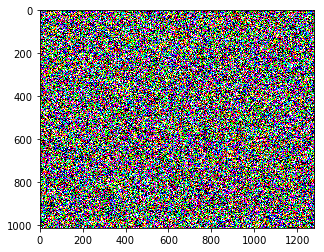

In [43]:
plt.imshow(x[0])

In [44]:
def solve_style_image(eval_obj,niter, x):
    for i in range(niter):
        x, min_val, info = scipy.optimize.fmin_l_bfgs_b(eval_obj.loss, x.flatten(), 
                                                   fprime= eval_obj.grads, maxfun = 20)
        x = np.clip(x,-127,127)
        print('style Loss is {}'.format(min_val))
        scipy.misc.imsave('style_at_iter_{}.jpg'.format(i), depreproc(x.copy(),style_shape)[0])
    return x

In [45]:
x = solve_style_image(style_evaluator, iterations, x)

style Loss is 21879.884765625
style Loss is 781.5469970703125
style Loss is 248.4627227783203
style Loss is 149.43594360351562
style Loss is 111.04634094238281
style Loss is 86.34388732910156
style Loss is 67.25187683105469
style Loss is 53.95261001586914
style Loss is 38.9214973449707
style Loss is 29.754959106445312


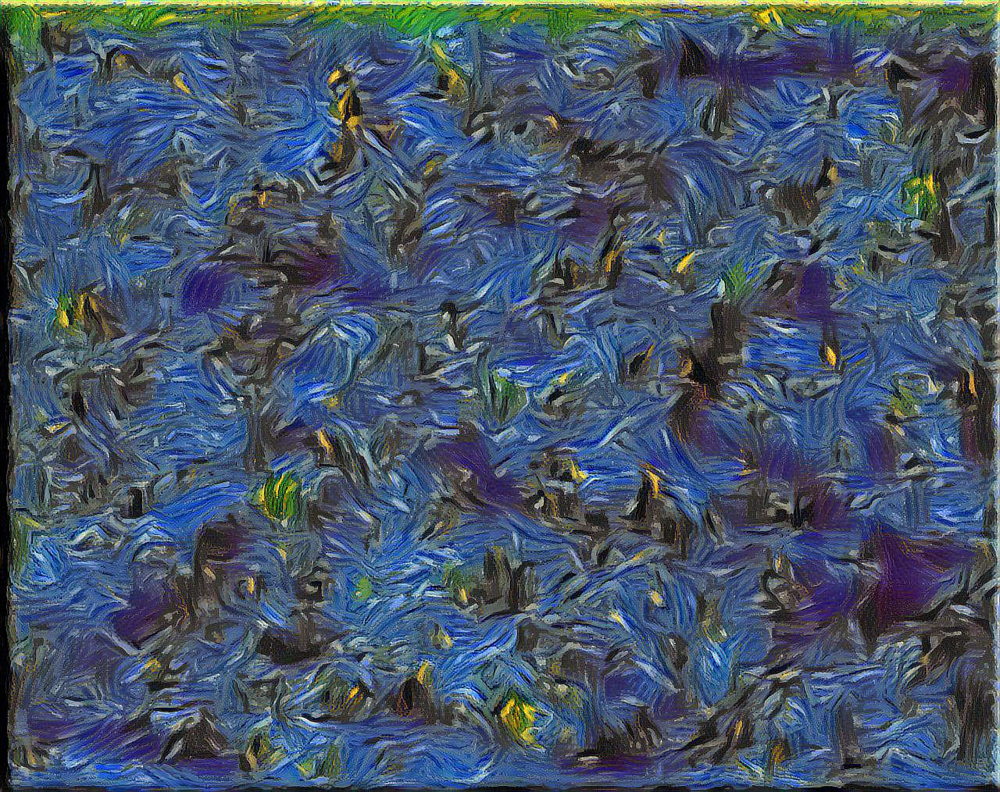

In [46]:
Image.open('style_at_iter_9.jpg')

#### Style Transfer 

In [48]:
def plot_arr(arr): plt.imshow(depreproc(arr,arr.shape)[0].astype('uint8'))

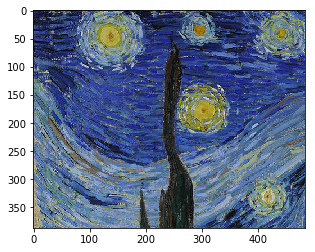

In [59]:
w,h = content_image_raw.size
style = style[:,:h,:w]
plot_arr(style)

In [61]:
content_shape

(1, 387, 484, 3)

In [60]:
style.shape, content.shape

((1, 387, 484, 3), (1, 387, 484, 3))

In [62]:
model = VGG16_Avg(include_top= False, input_shape = content_shape[1:])

In [63]:
outputs = {l.name:l.output for l in model.layers}

In [64]:
style_layers = [outputs['block{}_conv2'.format(o)] for o in range(1,6)]

In [65]:
content_layer = outputs['block4_conv2']

In [66]:
style_model_transfer = Model(model.input, style_layers)

In [67]:
style_targs = [K.variable(o) for o in style_model_transfer.predict(style)]

In [69]:
content_model_transfer = Model(model.input,content_layer)
content_targ = K.variable(content_model_transfer.predict(content))

In [70]:
style_wgts = [0.05,0.2,0.2,0.25,0.3]

In [83]:
loss = sum(style_loss(l1[0], l2[0])*w
           for l1,l2,w in zip(style_layers, style_targs, style_wgts))
loss += K.mean(keras.metrics.mse(content_layer, content_targ)/10)
grads = K.gradients(loss, model.input)
transfer_fn = K.function([model.input], [loss]+grads)

In [84]:
evaluator = Evaluator(transfer_fn, content_shape)

In [85]:
iterations=10
x = rand_img(style.shape)

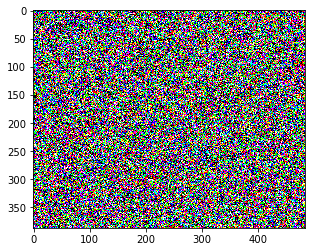

In [86]:
plt.imshow(x[0])

In [89]:
def solve_styleTransfer_image(eval_obj,niter, x):
    for i in range(niter):
        x, min_val, info = scipy.optimize.fmin_l_bfgs_b(eval_obj.loss, x.flatten(), 
                                                   fprime= eval_obj.grads, maxfun = 20)
        x = np.clip(x,-127,127)
        print('style Loss is {}'.format(min_val))
        scipy.misc.imsave('styleTransfer_at_iter_{}.jpg'.format(i), depreproc(x.copy(),content.shape)[0])
    return x

In [90]:
x = solve_styleTransfer_image(evaluator, iterations, x)

style Loss is 2465.3720703125
style Loss is 548.4371337890625
style Loss is 327.84759521484375
style Loss is 265.7890319824219
style Loss is 234.06321716308594
style Loss is 211.31146240234375
style Loss is 196.03640747070312
style Loss is 186.73397827148438
style Loss is 178.1239471435547
style Loss is 171.9568328857422


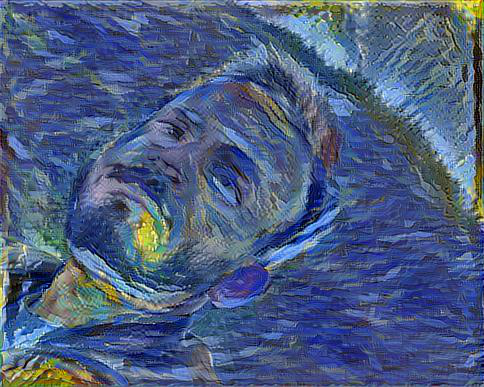

In [91]:
Image.open('styleTransfer_at_iter_9.jpg')

#### Conclusion

There are several limitations of this approach of styled image generation.
- content image and style image have to be of the same shape 
- every new image generation requires a run through an optimizaion path, which can be slow sometime. 

That said if we want to create a webapp which takes style and content image from user, then this is the way to go.
I will use CNN to build specialized cnn's for particular styles later after I implement super resolution first.

A key thing to remember is that all this is leading upto GAN's which are recent breakthrough in deep learning.